In [19]:
# import packages: numpy, math (you might need pi for gaussian functions)
import numpy as np
import math
from PIL import Image
import matplotlib.pyplot as plt
from scipy.signal import convolve2d as conv2

def rgb2gray(rgb):

    r, g, b = rgb[:,:,0], rgb[:,:,1], rgb[:,:,2]
    gray = 0.2989 * r + 0.5870 * g + 0.1140 * b

    return gray

img = rgb2gray(np.array(Image.open(r'C:\Users\Youri_Asnacios\Desktop\s1m2\cours\fundamentals\Assignment1 (1)\Filtering\graf.png')))

In [20]:
print(img.shape)

(640, 800)


# 1.A)

In [21]:
def gauss(sigma):
    t=np.arange(-3*sigma,3*sigma)
    Gx=[]
    for i in range(len(t)):
        Gx.append((1/(sigma*(2*math.pi)**0.5))*math.exp((-t[i]**2)/(2*sigma**2)))    
    return np.array(Gx), t

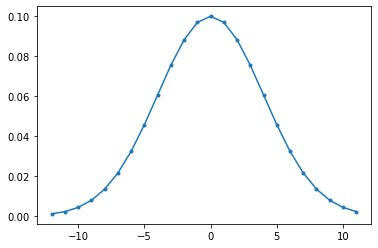

In [22]:
sigma = 4.0
[Gx, x] = gauss(sigma)

plt.figure(1)
plt.plot(x, Gx, '.-')
plt.show()

# 1.B)

In [23]:
import scipy

def gaussianfilter(img, sigma):
    g,x=gauss(sigma)
    kernel = g[:, np.newaxis] * g[np.newaxis, :]
    smooth_img=scipy.signal.convolve2d(img,kernel)
    return smooth_img


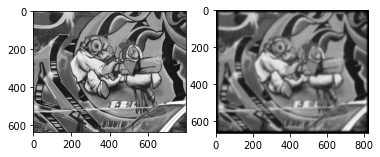

In [24]:
smooth_img = gaussianfilter(img, sigma)

plt.figure(2)
ax1 = plt.subplot(1,2,1)
ax2 = plt.subplot(1,2,2)
plt.sca(ax1)
plt.imshow(img, cmap='gray', vmin=0, vmax=255)
plt.sca(ax2)
plt.imshow(smooth_img, cmap='gray', vmin=0, vmax=255)
plt.show()


# 1.C)

In [25]:
def gaussdx(sigma):
        
    x = np.arange(-3*sigma,3*sigma)
    Dx = []
    for k in range(len(x)):
        Dx.append((-1/((sigma**3)*(2*math.pi)**0.5))*x[k]*math.exp((-x[k]**2)/(2*sigma**2)))
    
    
    return np.array(Dx), x

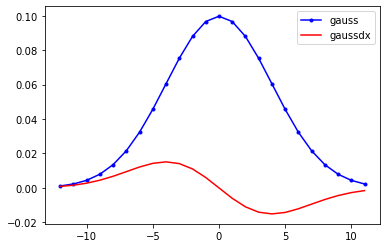

In [26]:
sigma = 4.0
[Gx, x] = gauss(sigma)
[Dx, x] = gaussdx(sigma)

plt.figure(5)
plt.plot(x, Gx, 'b.-')
plt.plot(x, Dx, 'r-')
plt.legend( ('gauss', 'gaussdx'))
plt.show()


# 1.D)

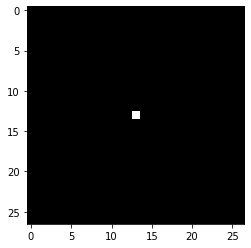

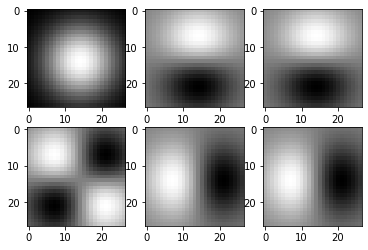

In [27]:
img_imp = np.zeros([27,27])
img_imp[13, 13] = 1.0
plt.figure(6), plt.imshow(img_imp, cmap='gray')

sigma = 7.0
[Gx, x] = gauss(sigma)
[Dx, x] = gaussdx(sigma)

Gx = Gx.reshape(1, Gx.size)
Dx = Dx.reshape(1, Dx.size)

plt.figure(7)
plt.subplot(2,3,1)
plt.imshow(conv2(conv2(img_imp, Gx, 'same'), Gx.T, 'same') , cmap='gray')
plt.subplot(2,3,2)
plt.imshow(conv2(conv2(img_imp, Gx, 'same'), Dx.T, 'same') , cmap='gray')
plt.subplot(2,3,3)
plt.imshow(conv2(conv2(img_imp, Dx.T, 'same'), Gx, 'same') , cmap='gray')
plt.subplot(2,3,4)
plt.imshow(conv2(conv2(img_imp, Dx, 'same'), Dx.T, 'same') , cmap='gray')
plt.subplot(2,3,5)
plt.imshow(conv2(conv2(img_imp, Dx, 'same'), Gx.T, 'same') , cmap='gray')
plt.subplot(2,3,6)
plt.imshow(conv2(conv2(img_imp, Gx.T, 'same'), Dx, 'same') , cmap='gray')
plt.show()

Explanations :

1) The firts operation is a two successively Gaussian convolution operations on the image. The first on x and the second on the y axis. As we know convolution is commutative so those operations are equivalent to convolve a sqared kernel of gaussian an the image. So the first image is the smoothed image of the figure 7.

2) Here, we first apply a Gaussian filter so reduce noise along x axis, and then apply a transpose derivative gaussian filter along y axis (because it's a transpose matrix). But this transpose derivative gaussian matrix can be decomposed in the convolution of a derivative function on the gaussian filter along y axis. And ass we already said in the previous question, convolution is a commutative operation. So we can be simply these convution operations to the convolution of a gaussian kernel on the whole image (x and y axis), and then a derivative along y axis. As we saw during lectures, derivative applies on a image gives an image where each ligth intenisty variations (eadges) appears either as a maxima or as a minima. Finally this operation on the image reveals the eadges along y axis, where maxima of intensity (betwen 0 and 10 along y axis) and minima (just lower than 20 along y axis) are the position of those eadges (we could have apply a thining algorithm in order to find more precisely the ordinate position of those eadges).

3) As we said convolution is commutative so that operation is similar as the previous.

4) The fourth operation convolves 2 Gaussian derivative funnctions along x ans y axis, because here we got Dx (for x axis) and Dx.T (for y axis). That is equivalent to apply a derivative Gaussian kernel on the image. So this image reveals points where the gradient magnitude is maximum, e.g. points where the sum of the norm of the gradient along x and along y axis is maximum.

5) It is similar to the 2) question but this time ot is on the x axis. We can ensure that thanks to maxima and minima that clearly reveals eadges along x axis (maxima is around 6 and minima around 22 along x axis).

6) Convolution is commutative so it's exactly the same operation as the previous question.

# 1.E)

In [28]:
def gaussderiv(img, sigma):
    smt_img=gaussianfilter(img, sigma)
    Dy=np.array([[-1/3,-1/3,-1/3],[0,0,0],[1/3,1/3,1/3]])
    Dx=np.array([[-1/3,0,1/3],[-1/3,0,1/3],[-1/3,0,1/3]])
    imgDx=scipy.signal.convolve2d(img,Dx)
    imgDy=scipy.signal.convolve2d(img,Dy)
    return imgDx, imgDy

<class 'numpy.ndarray'>


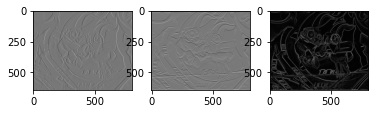

In [119]:
#img_c = np.array(Image.open('graf.png')).astype('double')
#img = rgb2gray(img_c)
[imgDx, imgDy] = gaussderiv(img, 7.0)

plt.figure(8)
ax1 = plt.subplot(1,3,1)
ax2 = plt.subplot(1,3,2)
ax3 = plt.subplot(1,3,3)
plt.sca(ax1)
plt.imshow(imgDx, cmap='gray')
plt.sca(ax2)
plt.imshow(imgDy, cmap='gray')
plt.sca(ax3)
imgmag = np.sqrt(imgDx**2 + imgDy**2)
plt.imshow(imgmag, cmap='gray')
plt.show()

In [121]:
[imgDx, imgDy] = gaussderiv(img, 7.0)

print((imgDx.shape))

(642, 802)


# 2.A)

In [163]:
def normalized_hist(img_gray, num_bins):
    assert len(img_gray.shape) == 2, 'image dimension mismatch'
    assert img_gray.dtype == 'float', 'incorrect image type'
    flattened_img = img_gray.reshape(img_gray.size)
    # normalization for intensity
    flattened_img = 255 / (flattened_img.max() - flattened_img.min()) * (flattened_img - flattened_img.min())
    #histogram
    bins = np.linspace(0, 255, num_bins)
    hists = []
    for i in range(num_bins - 1):
        mask = (flattened_img >= bins[i]) & (flattened_img < bins[i+1])
        hists.append(len(flattened_img[mask]))
    # normalization for histogram
    hists = np.array(hists)
    hists = hists / hists.sum()
    return hists, bins


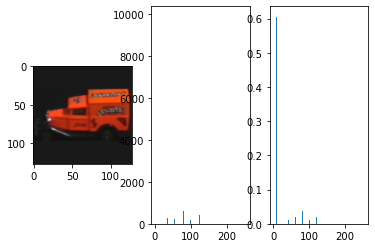

In [164]:
img_color = np.array(Image.open(r'C:\Users\Youri_Asnacios\Desktop\s1m2\cours\fundamentals\Assignment1 (1)\Identification\model\obj100__0.png'))
img_gray = rgb2gray(img_color.astype('double'))

plt.figure(1)
plt.subplot(1,3,1)
plt.imshow(img_color)

plt.subplot(1,3,2)
num_bins_gray = 40
hist_gray1, bin_gray1 = np.histogram(img_gray.reshape(img_gray.size), num_bins_gray,(0,255))
plt.bar((bin_gray1[0:-1] + bin_gray1[1:])/2, hist_gray1)

plt.subplot(1,3,3)
hist_gray2, bin_gray2 = normalized_hist(img_gray, num_bins_gray)
plt.bar((bin_gray2[0:-1] + bin_gray2[1:])/2, hist_gray2)
plt.show()


# 2.B)

In [147]:
import cv2

def rgb_hist(img_color_double, num_bins):
    assert len(img_color_double.shape) == 3, 'image dimension mismatch'
    assert img_color_double.dtype == 'float', 'incorrect image type'


    r, g, b = cv2.split(img_color_double)
    r = r.flatten()
    g = g.flatten()
    b = b.flatten()

    z = list(zip(r,g,b))


    #Define a 3D histogram  with "num_bins^3" number of entries
    hists = np.zeros((num_bins, num_bins, num_bins))
    
    # Loop for each pixel i in the image 
    #for i in range(img_color_double.shape[0]*img_color_double.shape[1]):
    # Increment the histogram bin which corresponds to the R,G,B value of the pixel i
        
    for x in z:
        for i in range(0, 5):
            for y in range(0, 5):
                  for j in range(0, 5):
                        if x[0] > (i * 51) and x[0] <= ((i + 1) * 51) and x[1] > (y * 51) and x[1] <= ((y + 1) * 51) and x[2] > (j * 51) and x[2] <= ((j + 1) * 51):
                            hists[i][y][j] += 1
        


    #Normalize the histogram such that its integral (sum) is equal 1
    #... (your code here)
    mode = np.sum(hists) * 256
    hists = (hists / mode)
    
    # Return the histogram as a 1D vector
    hists = hists.reshape(hists.size)
    return hists

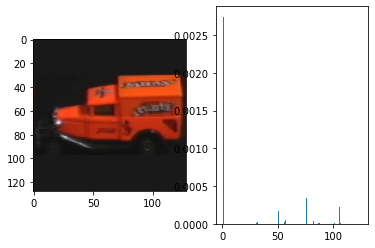

In [149]:
plt.figure(2)
plt.subplot(1,2,1)
plt.imshow(img_color)

num_bins_color = 5
plt.subplot(1,2,2)
hist_rgb = rgb_hist(img_color.astype('double'), num_bins_color)
plt.bar(np.array(range(1,hist_rgb.size+1)),hist_rgb)
plt.show()

In [116]:
def rg_hist(img_color_double, num_bins):
    assert len(img_color_double.shape) == 3, 'image dimension mismatch'
    assert img_color_double.dtype == 'float', 'incorrect image type'


     # ... (your code here)
    r, g, b = cv2.split(img_color_double)

    r = r.flatten()
    g = g.flatten()

    z = list(zip(r, g))

    # Define a 2D histogram  with "num_bins^2" number of entries
    hists = np.zeros((num_bins, num_bins))

    # ... (your code here)
    for x in z:
        for i in range(0, 5):
            for y in range(0, 5):
                    if x[0] > (i * 51) and x[0] <= ((i + 1) * 51) and (y * 51) < x[1] <= ((y + 1) * 51):
                        hists[i][y] += 1

    mode = np.sum(hists) * 256
    hists = hists / mode
    # Return the histogram as a 1D vector
    hists = hists.reshape(hists.size)

    return hists

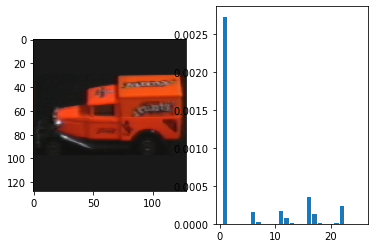

In [134]:
plt.figure(3)
plt.subplot(1,2,1)
plt.imshow(img_color)

num_bins_color = 5
plt.subplot(1,2,2)
hist_rg = rg_hist(img_color.astype('double'), num_bins_color)
plt.bar(np.array(range(1,hist_rg.size+1)),hist_rg)
plt.show()

# 2.C)

In [124]:
#  Compute the *joint* histogram of Gaussian partial derivatives of the image in x and y direction
#  Set sigma to 3.0 and cap the range of derivative values is in the range [-6, 6]
#  The histogram should be normalized so that sum of all values equals 1
#
#  img_gray - input gray value image
#  num_bins - number of bins used to discretize each dimension, total number of bins in the histogram should be num_bins^2
#
#  Note: you may use the function gaussderiv from the Filtering exercise (gauss_module.py)
def dxdy_hist(img_gray, num_bins):
    assert len(img_gray.shape) == 2, 'image dimension mismatch'
    assert img_gray.dtype == 'float', 'incorrect image type'
    
    imgDx,imgDy=gaussderiv(img_gray, 3)
    imgDx=imgDx.flatten()
    imgDy=imgDy.flatten()
    
    z=list(zip(imgDx,imgDy))
    #Define a 2D histogram  with "num_bins^2" number of entries
    hists = np.zeros((num_bins, num_bins))


    for x in z:
        for i in range(0, 5):
            for y in range(0, 5):
                    if x[0] > (i * 51) and x[0] <= ((i + 1) * 51) and (y * 51) < x[1] <= ((y + 1) * 51):
                        hists[i][y] += 1


                        
    mode = np.sum(hists) * 256
    hists = hists / mode
    #Return the histogram as a 1D vector
    hists = hists.reshape(hists.size)
    return hists

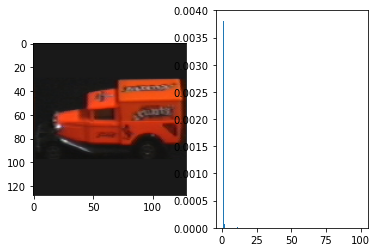

In [125]:
plt.figure(5)
plt.subplot(1,2,1)
plt.imshow(img_color)

num_bins_dxdy = 10
plt.subplot(1,2,2)
hist_dxdy = dxdy_hist(img_gray, num_bins_dxdy)
plt.bar(np.array(range(1,hist_dxdy.size+1)),hist_dxdy)
plt.show()

In [155]:
import numpy as np
import math

# Compute the intersection distance between histograms x and y
# Return 1 - hist_intersection, so smaller values correspond to more similar histograms
# Check that the distance range in [0,1]
def dist_intersect(x,y):   
    s=0
    for k in range(len(x)):
        s += min(x[k],y[k])
    res = ((s/sum(x))+s/sum(y))*0.5
    #assert (1-res >= 0 and 1-res <= 0),"Distance range not in [0,1]"
    return 1-res

# Compute the L2 distance between x and y histograms
# Check that the distance range in [0,sqrt(2)]
def dist_l2(x,y): 
    s=0
    for k in range(len(x)):
        s += (x[k]-y[k])**2
        
    #assert (s >= 0 and s <= 2**0.5),"Distance range not in [0,sqrt(2)]"
    return s

# Compute chi2 distance between x and y
# Check that the distance range in [0,Inf]
# Add a minimum score to each cell of the histograms (e.g. 1) to avoid division by 0

def dist_chi2(x,y):    
    s=0
    for k in range(len(x)):
        x[k]+=1
        y[k]+=1
        s += ((x[k]-y[k])**2)/(x[k]+y[k])
        print(s)
     
    #assert (s >= 0),"Distance range not in [0,inf]"
    return s

def get_dist_by_name(x, y, dist_name):
    x = x.reshape(1, x.size)
    y = y.reshape(1, y.size)
    
    if dist_name == 'chi2':
        return dist_chi2(x[0],y[0])
    elif dist_name == 'intersect':
        return dist_intersect(x[0],y[0])
    elif dist_name == 'l2':
        return dist_l2(x[0],y[0])
    else:
        assert False, 'unknown distance: %s'%dist_name
        

def is_grayvalue_hist(hist_name):
    if hist_name == 'grayvalue' or hist_name == 'dxdy':
        return True
    elif hist_name == 'rgb' or hist_name == 'rg':
        return False
    else:
        assert False, 'unknown histogram type'

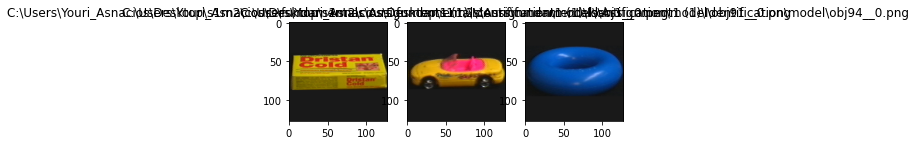

Distance according to dist_l2 0.000000
Distance according to dist_interset 0.137741
2.6185016697113516e-08
2.6185046886874284e-08
2.6185046886874284e-08
2.6185046886874284e-08
2.6185046886874284e-08
2.6185046886874284e-08
2.6185046886874284e-08
2.6185046886874284e-08
2.6185046886874284e-08
2.6185046886874284e-08
2.6185046886874284e-08
2.6185046886874284e-08
2.6185046886874284e-08
2.6185046886874284e-08
2.6185046886874284e-08
2.6185046886874284e-08
2.6185046886874284e-08
2.6185046886874284e-08
2.6185046886874284e-08
2.6185046886874284e-08
2.6185046886874284e-08
2.6185046886874284e-08
2.6185046886874284e-08
2.6185046886874284e-08
2.6185046886874284e-08
2.6185046886874284e-08
2.6185046886874284e-08
2.6185046886874284e-08
2.6185046886874284e-08
2.6185046886874284e-08
2.6185077076635052e-08
2.6185077076635052e-08
2.6185077076635052e-08
2.6185077076635052e-08
2.6185077076635052e-08
2.6185077076635052e-08
2.6185077076635052e-08
2.6185077076635052e-08
2.6185077076635052e-08
2.6185077076635052e

NameError: name 'get_hist_by_name' is not defined

In [157]:
image_files1 = [r'C:\Users\Youri_Asnacios\Desktop\s1m2\cours\fundamentals\Assignment1 (1)\Identification\model\obj1__0.png']
image_files2 = [r'C:\Users\Youri_Asnacios\Desktop\s1m2\cours\fundamentals\Assignment1 (1)\Identification\model\obj91__0.png', r'C:\Users\Youri_Asnacios\Desktop\s1m2\cours\fundamentals\Assignment1 (1)\Identification\model\obj94__0.png']

plt.figure()
plt.subplot(1,3,1); plt.imshow(np.array(Image.open(image_files1[0])), vmin=0, vmax=255); plt.title(image_files1[0])
plt.subplot(1,3,2); plt.imshow(np.array(Image.open(image_files2[0])), vmin=0, vmax=255); plt.title(image_files2[0])
plt.subplot(1,3,3); plt.imshow(np.array(Image.open(image_files2[1])), vmin=0, vmax=255); plt.title(image_files2[1])
plt.show()

img1_color = np.array(Image.open(image_files1[0]))
img2_color = np.array(Image.open(image_files2[0]))
num_bins_color = 30
hist1_rgb = rgb_hist(img1_color.astype('double'), num_bins_color)
hist2_rgb = rgb_hist(img2_color.astype('double'), num_bins_color)

print('Distance according to dist_l2 %f'% dist_l2(hist1_rgb,hist2_rgb))
print('Distance according to dist_interset %f'% dist_intersect(hist1_rgb,hist2_rgb))
print('Distance according to dist_chi2 %f'% dist_chi2(hist1_rgb,hist2_rgb))


distance_types = ['l2', 'intersect', 'chi2']
print('distance functions:', distance_types)

hist_types = ['grayvalue', 'rgb', 'rg', 'dxdy']
print('histogram types:', hist_types)

num_bins_color = 30;
num_bins_gray = 90;

for img1_file in image_files1:
    img1_color = np.array(Image.open(img1_file))
    img1_color = img1_color.astype('double')
    img1_gray = rgb2gray(img1_color)
    
    for img2_file in image_files2:
        img2_color = np.array(Image.open(img2_file))
        img2_color = img2_color.astype('double')
        img2_gray = rgb2gray(img2_color)
    
        D = np.zeros( (len(distance_types),len(hist_types)) )
    
        for didx in range(len(distance_types)):
    
            for hidx in range(len(hist_types)):
    
                if is_grayvalue_hist(hist_types[hidx]):
                    hist1 = get_hist_by_name(img1_gray, num_bins_gray, hist_types[hidx])
                    hist2 = get_hist_by_name(img2_gray, num_bins_gray, hist_types[hidx])
            
                else:
                    hist1 = get_hist_by_name(img1_color, num_bins_color, hist_types[hidx])
                    hist2 = get_hist_by_name(img2_color, num_bins_color, hist_types[hidx])
    
                if len(hist1) == 2:
                    hist1 = hist1[0]
                if len(hist2) == 2:
                    hist2 = hist2[0]
    
                D[didx, hidx] = get_dist_by_name(hist1, hist2, distance_types[didx])
         
        print('Comparison of images "%s" to "%s":'% (img1_file, img2_file))
        print(D)
        print('\n')


print('Legend:')
print('%s-%s, %s-%s, %s-%s, %s-%s'%('l2', 'grayvalue', 'l2', 'rgb', 'l2', 'rg', 'l2', 'dxdy'))
print('%s-%s, %s-%s, %s-%s, %s-%s'%('intersect', 'grayvalue', 'intersect', 'rgb', 'intersect', 'rg', 'intersect', 'dxdy'))
print('%s-%s, %s-%s, %s-%s, %s-%s'%('chi2', 'grayvalue', 'chi2', 'rgb', 'chi2', 'rg', 'chi2', 'dxdy'))

# 3.A)

In [160]:
import numpy as np
import matplotlib.pyplot as plt

def find_best_match(model_images, query_images, dist_type, hist_type, num_bins):

    #hist_isgray = histogram_module.is_grayvalue_hist(hist_type)
    
    #model_hists = compute_histograms(model_images, hist_type, hist_isgray, num_bins)
    #query_hists = compute_histograms(query_images, hist_type, hist_isgray, num_bins)
    
    D = np.zeros((len(model_images), len(query_images)))
    
    # For each image of the list query_images
    for k in range(len(query_images)):
        
        best_match = 0
        best_dist = 1
        
        # We take the distance between this query image and each model image
        for j in range(len(model_images)):

            d = get_dist_by_name(query_images[k], model_images[j], dist_type)

            if d<best_dist:
                best_dist = d 
                best_match = j

            D[best_match][k] = best_dist
        
    #get_hist_by_name(img, num_bins, hist_type)

    return best_match, D



def compute_histograms(image_list, hist_type, hist_isgray, num_bins):
    
    image_hist = []

    # Compute hisgoram for each image and add it at the bottom of image_hist

    #... (your code here)

    return image_hist

In [162]:
with open(r'C:\Users\Youri_Asnacios\Desktop\s1m2\cours\fundamentals\Assignment1 (1)\Identification\model.txt') as fp:
    model_images = fp.readlines()
model_images = [x.strip() for x in model_images] 

with open(r'C:\Users\Youri_Asnacios\Desktop\s1m2\cours\fundamentals\Assignment1 (1)\Identification\query.txt') as fp:
    query_images = fp.readlines()
query_images = [x.strip() for x in query_images] 

dist_type = 'intersect';
hist_type = 'rg';
num_bins = 30;

[best_match, D] = find_best_match(model_images, query_images, dist_type, hist_type, num_bins)

AttributeError: 'str' object has no attribute 'reshape'

# 3.B)

In [ ]:
# For each image file from 'query_images' find and visualize the 5 nearest images from 'model_image'.
#
# Note: use the previously implemented function 'find_best_match'
# Note: use subplot command to show all the images in the same Python figure, one row per query image

def show_neighbors(model_images, query_images, dist_type, hist_type, num_bins):

    n = 5  # show the top-5 neighbors

    
    
    for i in range(len(query_images)):
        res = []
        l = []
        query_image = query_images[i]
        res.append(query_image)
        
        for k in range(n):    
            l.append(find_best_neighbors(query_image,model_images,l,dist_type))
            res.append(model_images[l[k]])
            #print("L : ",l)

        fig=plt.figure(figsize=(10, 10))
        columns = n
        rows = len(query_images)
        for i in range(1,len(res)):
            fig.add_subplot(rows, columns, i)
            plt.imshow(res[i])
    plt.show()

In [ ]:
query_images_vis = [query_images[i] for i in np.array([0,4,9])]
match_module.show_neighbors(model_images, query_images_vis, dist_type, hist_type, num_bins)

# 3.C)

In [ ]:
def find_best_neighbors(query_image,model_images,l,dist_type):
    
    best_dist = 1
    best_match = 0
    
    for j in range(len(model_images)):

        d = get_dist_by_name(query_image, model_images[j], dist_type)

        if d<best_dist and j not in l:
            best_dist = d 
            best_match = j
            
    return best_match

In [ ]:
import ipdb; ipdb.set_trace()
num_correct = sum( best_match == range(len(query_images)) )
print('number of correct matches: %d (%f)\n'% (num_correct, 1.0 * num_correct / len(query_images)))

# 4.A)

In [386]:
def plot_rpc(a,tau): #here tau is a list of thresold for instance, tau=[2e-8,2.5e-8,3e-8,3.5e-8,4e-8,4.5e-8,5e-8,5.5e-8,6e-8]
    
    recall = []
    precision = []
    num_queries = a.shape[1]
    num_images = a.shape[0]
    assert(num_images == num_queries), 'Distance matrix should be a square matrix'
    
    #labels = np.diag([1]*num_images)  
    #d = D.reshape(D.size)
    #l = labels.reshape(labels.size) 
    #sortidx = d.argsort()
    #d = d[sortidx]
    #l = l[sortidx]
    
    for t in tau:
        fp=0
        fn=0
        tp=0
        tn=0
        for i in range(num_queries):
            for j in range(num_images):
                if i!=j:
                    if (a[i][j]).item()>t:
                        tn+=1
                    elif (a[i][j]).item()<=t:
                        fp+=1
                else:
                    if (a[i][j]).item()<=t:
                        tp+=1
                    else:
                        fn+=1
    
        prec=(tp/(tp+fp))
        rec=(tp/(tp+fn))
        precision.append(prec)
        recall.append(rec)
    print(recall)
    print(precision)
    
    plt.plot([1-precision[i] for i in range(len(precision))], recall)
    
        

# 4.B)


In [389]:
with open(r'C:\Users\Youri_Asnacios\Desktop\s1m2\cours\fundamentals\Assignment1 (1)\Identification\model.txt') as fp:
    model_images = fp.readlines()
a=r'C:\Users\Youri_Asnacios\Desktop\s1m2\cours\fundamentals\Assignment1 (1)\Identification'
for k in range(len(model_images)):
    model_images[k]=model_images[k].replace('/','\\')
    model_images[k]=model_images[k].replace('\n','')
    model_images[k]= a +'\\'+ model_images[k]
    model_images[k]=rgb2gray(np.array(Image.open(model_images[k])))
    
with open(r'C:\Users\Youri_Asnacios\Desktop\s1m2\cours\fundamentals\Assignment1 (1)\Identification\query.txt') as fp:
    query_images = fp.readlines()
a=r'C:\Users\Youri_Asnacios\Desktop\s1m2\cours\fundamentals\Assignment1 (1)\Identification'
for k in range(len(query_images)):
    query_images[k]=query_images[k].replace('/','\\')
    query_images[k]=query_images[k].replace('\n','')
    query_images[k]= a +'\\'+ query_images[k]
    query_images[k]=rgb2gray(np.array(Image.open(query_images[k])))


D_intersect = np.zeros((len(model_images[:20]), len(query_images[:20])))
for i in range(len(model_images[:20])):
    for j in range(len(query_images[:20])):
        D_intersect[i][j]=get_dist_by_name(model_images[i], query_images[j], 'intersect')

D_l2 = np.zeros((len(model_images[:20]), len(query_images[:20])))
for i in range(len(model_images[:20])):
    for j in range(len(query_images[:20])):
        D_l2[i][j]=get_dist_by_name(model_images[i], query_images[j], 'l2')
        
D_chi = np.zeros((len(model_images[:20]), len(query_images[:20])))
for i in range(len(model_images[:20])):
    for j in range(len(query_images[:20])):
        D_chi[i][j]=get_dist_by_name(model_images[i], query_images[j], 'chi2')

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


KeyboardInterrupt: 

In [387]:
#print(D)

[0.15, 0.15, 0.25, 0.25, 0.3, 0.3, 0.3, 0.3, 0.4, 0.45, 0.55, 0.7, 0.8, 0.8, 0.85, 0.9, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.9166666666666666, 0.6363636363636364, 0.5714285714285714, 0.45714285714285713, 0.3269230769230769, 0.2857142857142857, 0.15873015873015872, 0.09569377990430622, 0.06535947712418301, 0.05405405405405406, 0.05037783375314862, 0.05]


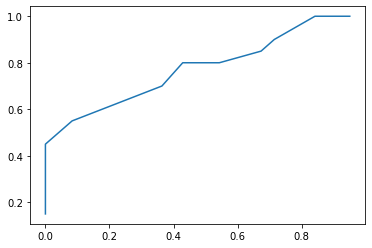

In [388]:
to=np.ndarray.tolist(np.arange(0.05,0.2,0.01))
t_=[0.25,0.3,0.35,0.4,0.45,0.5]
tau_intersect=to+t_
test=plot_rpc(D_intersect,tau_intersect)



Report :

Code 4.a) :

For this question we try to use the precode but didn't understand how to use the preprocessing of data part included in
the provided code. So we try an over way, and it seems to work (we put # at the begining of lines we finally not used from the provided code).
The code we have created works according to a disjunction of cases: first it checks whether the element in question is on a diagonal or not. Depending on the result, it compares the value of the element to the threshold and adds one to tp, tn, fp or fn.
At the end of the loop over the whole matrix, he adds the "precision" and "recall" values to the tables with the same name, and repeats with another threshold value until he has done all the threshold values.

Report 4.b)

The first difficulty was to import the data correctly in order to work on it. The .txt files, containing the names of the images started with "/" while the paths to import the data on jupyter use "\". So there must have been a bit of textual preprocessing to access the data.
The first cell contains this part of textual preprocessing as well as the construction of the distance matrices to be given in parameters to the function constructed in question 4.A). To do this we used the get_dist_by_name() function used in part 3.And finally we could draw our precision/recall curves after manually constructing a Tau list.

The main problems encountered were related to the Tau list. During the first tests of the function, the curve described a right angle without any variations. We immediately understood that this error came from the Tau list which was not precise enough. As a result, I detailed the Tau values in more detail and the curves started to show a good trend.

The limitations of this code lie in the design of the Tau lists and the calculation time. Indeed, it is necessary to build a different Tau list for each type of distances since the distance values are not the same each time. The computation time is due to the calculation of distances increasing in N^2 with the number of input requests.
Because of this long time the curves were drawn with only 20 queries and 20 images.

But finally, we think that those results are pretty good looks to the last curve pretty close to the objective.